<a href="https://colab.research.google.com/github/shirof30/Detectron/blob/main/Detectron_Plane_Detector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Assignment 3

This is a template notebook for Assignment 3.


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat Nov  6 19:15:54 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Install dependencies and initialization

In [ ]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.9/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.9/index.html
     |████████████████████████████████| 6.9 MB 606 kB/s 
     |████████████████████████████████| 130 kB 5.2 MB/s 
     |████████████████████████████████| 74 kB 4.8 MB/s 
     |████████████████████████████████| 49 kB 8.0 MB/s 
     |████████████████████████████████| 145 kB 29.2 MB/s 
     |████████████████████████████████| 749 kB 55.8 MB/s 
     |████████████████████████████████| 743 kB 44.3 MB/s 
     |████████████████████████████████| 112 kB 76.8 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20211023-py3-none-any.whl size=60947 sha256=fc1b5b5b1b887e331a9bab18b3c0cdbcb39ee4f73397c603eafbc1dd56118437
  Stored in directory: /root/.cache/pip/wheels/16/98/fc/252d62cab6263c719120e06b28f3378af59b52ce7a20e81852
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=521db70f85a1cfed989b80dcece07452ddd26897ca78404e1910bbb30a4527f

In [ ]:
!pwd # shows current directory
!ls  # shows all files in this directory
!nvidia-smi # shows the specs and the current status of the allocated GPU

/content
'=2.0.1'   sample_data
Sun Nov  7 16:38:09 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                        

In [ ]:
# import some common libraries
from google.colab.patches import cv2_imshow
from sklearn.metrics import jaccard_score
from PIL import Image, ImageDraw
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import datetime
import random
import json
import cv2
import csv
import os

# import some common pytorch utilities
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torch.autograd import Variable
import torch.nn.functional as F
import torch.nn as nn
import torch

# import some common detectron2 utilities
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.utils.logger import setup_logger
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import Visualizer
from detectron2.data import build_detection_test_loader
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
setup_logger()

<Logger detectron2 (DEBUG)>

In [ ]:
# Make sure that GPU is available for your notebook. 
# Otherwise, you need to update the settungs in Runtime -> Change runtime type -> Hardware accelerator
torch.cuda.is_available()

True

In [ ]:
# You need to mount your google drive in order to load the data:
from google.colab import drive
drive.mount('/content/drive')
# Put all the corresponding data files in a data folder and put the data folder in a same directory with this notebook.
# Also create an output directory for your files such as the trained models and the output images.

Mounted at /content/drive


In [ ]:
# Define the location of current directory, which should contain data/train, data/test, and data/train.json.
# TODO: approx 1 line
BASE_DIR = '/content/drive/My Drive/CMPT_CV_lab3/'
OUTPUT_DIR = '{}/output'.format(BASE_DIR)
os.makedirs(OUTPUT_DIR, exist_ok=True)

## Part 1: Object Detection

### Data Loader

In [ ]:
'''
# This function should return a list of data samples in which each sample is a dictionary. 
# Make sure to select the correct bbox_mode for the data
# For the test data, you only have access to the images, therefore, the annotations should be empty.
# Other values could be obtained from the image files.
# TODO: approx 35 lines
'''

def get_detection_data(set_name):
  data_dirs = '{}/data'.format(BASE_DIR)
  set_dir =  data_dirs + '/' + set_name
  
  dataset = []
  if (set_name == "test"):
    for img_name in os.listdir(set_dir):
        i = 0
        objects = []
        record = {}
        image = Image.open(set_dir+"/"+img_name)      
        filename = os.path.join(set_dir, img_name)
        height, width = cv2.imread(filename).shape[:2]
        record["file_name"] = filename
        record["width"] = width
        record["height"] = height
        record["image_id"] = i
        record["annotations"] = objects
        dataset.append(record)
        i += 1  

  if (set_name == "train"):
    json_file = os.path.join(data_dirs,"train.json")
    with open(json_file) as f:
      img_get = json.load(f)
    
    for idx, fdata in enumerate(img_get):
        record = {}
        isDuplicate = False

        filename = os.path.join(set_dir, fdata["file_name"])
        height, width = cv2.imread(filename).shape[:2]
        
        fInput = {
          "bbox": fdata["bbox"],
          "bbox_mode": BoxMode.XYWH_ABS,
          "category_id": 0,
          "segmentation": fdata["segmentation"],
          "iscrowd": fdata["iscrowd"],
        }
        
        for iter in dataset:
          if iter["file_name"] == filename:
            isDuplicate = True
            iter["annotations"].append(fInput)
            record = iter
            break


        if (isDuplicate == False):
          record["file_name"] = filename
          record["height"] = height
          record["width"] = width
          record["image_id"] = fdata["image_id"]
          objs = []
          objs.append(fInput)
          record["annotations"] = objs
          dataset.append(record)
  

  return dataset

In [ ]:
'''
# Remember to add your dataset to DatasetCatalog and MetadataCatalog
# Consdier "data_detection_train" and "data_detection_test" for registration
# You can also add an optional "data_detection_val" for your validation by spliting the training data
# TODO: approx 5 lines
'''

for d in ["train", "test"]:
  DatasetCatalog.register("data_detection_" + d, lambda d=d: get_detection_data(d))
  MetadataCatalog.get("data_detection_" + d).set(thing_classes=["plane"])
data_detection_metadata = MetadataCatalog.get("data_detection_train")


In [ ]:
'''
# Visualize some samples using Visualizer to make sure that the function works correctly
# TODO: approx 5 lines
'''
dataset_visualize = get_detection_data("train")
for d in random.sample(dataset_visualize, 3):
  img = cv2.imread(d["file_name"])
  visualizer = Visualizer(img[:, :, ::-1], metadata=data_detection_metadata, scale=0.5)
  out = visualizer.draw_dataset_dict(d)
  cv2_imshow(out.get_image()[:, :, ::-1])



### Set Configs

In [ ]:
'''
# Set the configs for the detection part in here.
# TODO: approx 15 lines
'''
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "{}/output/".format(BASE_DIR)

cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TEST = ()
cfg.DATASETS.TRAIN = ("data_detection_train",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 1

#Hyperparameters
cfg.SOLVER.BASE_LR = 0.0001  
cfg.SOLVER.MAX_ITER = 500    #ganti ini
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.IMS_PER_BATCH = 2   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  

#finalstep
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


### Training

In [ ]:
'''
# Create a DefaultTrainer using the above config and train the model
# TODO: approx 5 lines
'''

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


### Evaluation and Visualization

In [ ]:
'''
# After training the model, you need to update cfg.MODEL.WEIGHTS
# Define a DefaultPredictor
'''
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6 
predictor = DefaultPredictor(cfg)

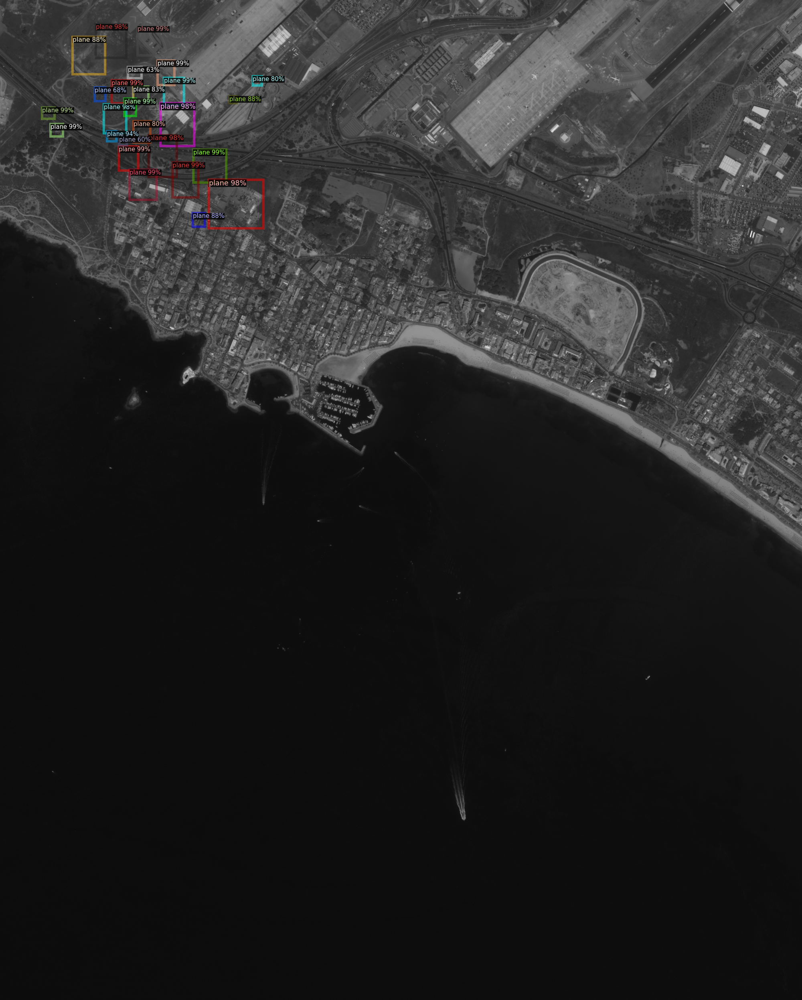

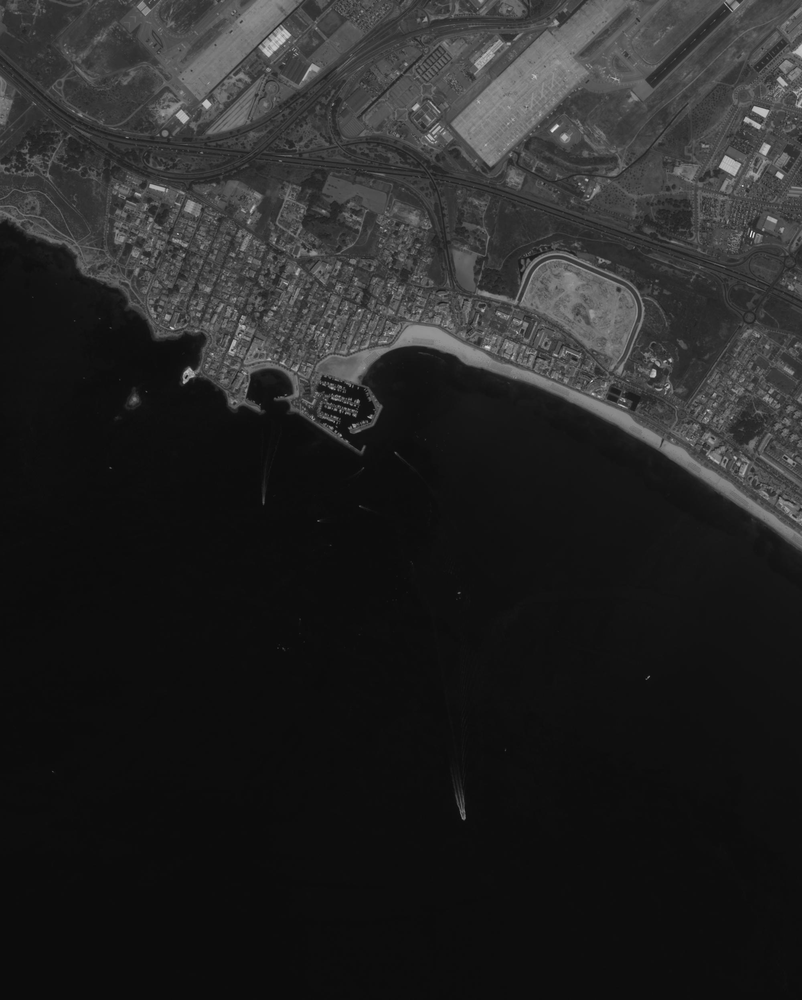

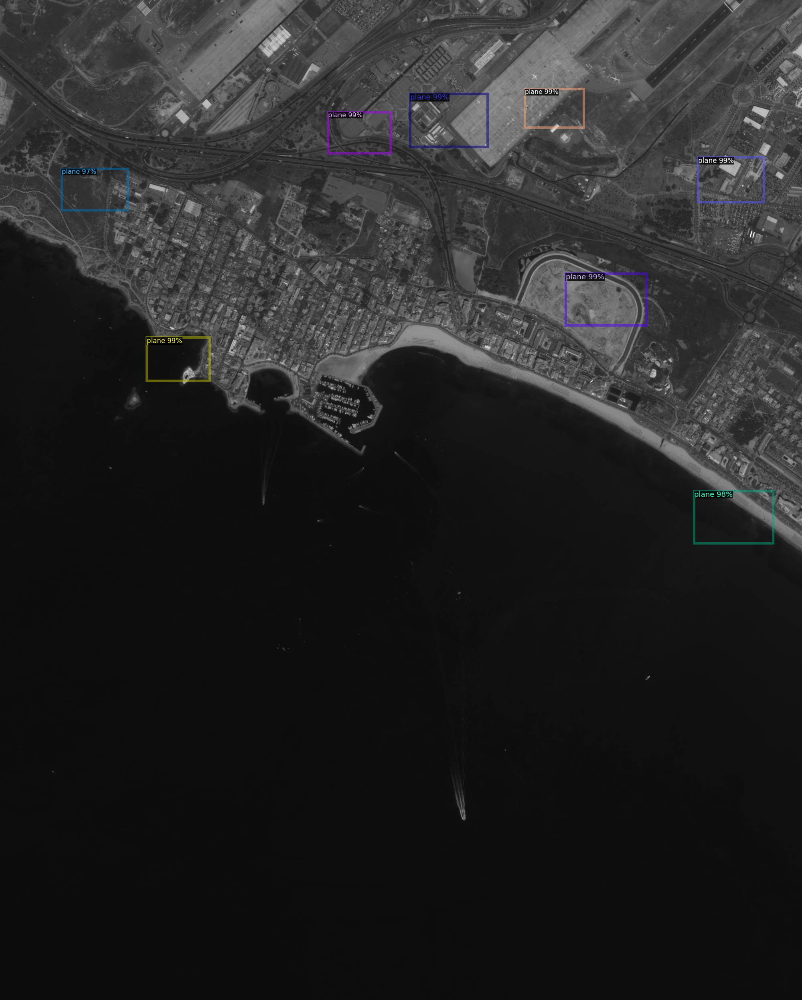

In [ ]:
'''
# Visualize the output for 3 random test samples
# TODO: approx 10 lines
'''
dataset_dicts = get_detection_data("test")
for d in random.sample(dataset_dicts, 3):
  images = cv2.imread(d["file_name"])
  outputs = predictor(images)
  v = Visualizer(im[:, :, ::-1], 
                 metadata = data_detection_metadata,
                 scale = 0.5,
                 )
  instances = outputs["instances"].to("cpu")
  out = v.draw_instance_predictions(instances)
  cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
'''
# Use COCOEvaluator and build_detection_train_loader
# You can save the output predictions using inference_on_dataset
# TODO: approx 5 lines
'''
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("data_detection_train", cfg, False, output_dir="./output/")
val_loader = build_detection_train_loader(cfg, "data_detection_train")
print(inference_on_dataset(trainer.model, val_loader, evaluator))



### Improvements

For this part, you can bring any improvement which you have by adding new input parameters to the previous functions or defining new functions and variables.

In [ ]:
'''
# Bring any changes and updates regarding the improvement in here
'''


## Part 2: Semantic Segmentation

### Data Loader

In [ ]:
'''
# Write a function that returns the cropped image and corresponding mask regarding the target bounding box
# idx is the index of the target bbox in the data
# high-resolution image could be passed or could be load from data['file_name']
# You can use the mask attribute of detectron2.utils.visualizer.GenericMask 
#     to convert the segmentation annotations to binary masks
# TODO: approx 10 lines
'''

from detectron2.utils.visualizer import GenericMask
from matplotlib import pyplot as plt    # For binary mask

def get_instance_sample(data, idx, img=None):
  image = cv2.imread(data.get("file_name"))
  annot = data.get("annotations")[idx[1]]
  bbox = annot["bbox"]
  xmin = int(bbox[0])
  xmax = int(bbox[0] + (bbox[2]))
  ymin = int(bbox[1])
  ymax = int(bbox[1] + (bbox[3]))
  object_img = image[ymin:ymax+1,xmin:xmax+1]

  object_mask = np.zeros(shape=(object_img.shape[0], object_img.shape[1] ), dtype=np.float32)
  coord = []
  
  for i in range(0,len(annot.get("segmentation")[0]),2):
    x = annot.get("segmentation")[0][i] - xmin
    y = annot.get("segmentation")[0][i+1] - ymin
    coord.append([x,y])

  plane = np.array(coord, np.int32)
  cv2.fillPoly(object_mask, [plane], 1)
  obj_mask.astype(bool)
  

  return obj_img, obj_mask


In [ ]:
'''
# We have provided a template data loader for your segmentation training
# You need to complete the __getitem__() function before running the code
# You may also need to add data augmentation or normalization in here
'''

class PlaneDataset(Dataset):
  def __init__(self, set_name, data_list):
      self.transforms = transforms.Compose([
          transforms.ToTensor(),
          transforms.Normalize([0,0,0],[1,1,1])],)
      #self.mask_transform = torch.sigmoid([
          #transforms.ToTensor(),
        #])
      self.mask_transform = transforms.Compose([
          transforms.ToTensor(),
        ])
      self.set_name = set_name
      self.data = data_list
      self.instance_map = []
      for i, d in enumerate(self.data):
        for j in range(len(d['annotations'])):
          self.instance_map.append([i,j])

  '''
  # you can change the value of length to a small number like 10 for debugging of your training procedure and overfeating
  # make sure to use the correct length for the final training
  '''
  def __len__(self):
      return len(self.instance_map)

  def numpy_to_tensor(self, img, mask):
    if self.transforms is not None:
        img = self.transforms(img)
    mask = self.mask_transform(mask)
    img = torch.tensor(img, dtype=torch.float)
    mask = torch.tensor(mask, dtype=torch.float)

    return img, mask
  '''
  # Complete this part by using get_instance_sample function
  # make sure to resize the img and mask to a fixed size (for example 128*128)
  # you can use "interpolate" function of pytorch or "numpy.resize"
  # TODO: 5 lines
  '''
  def __getitem__(self, idx):
    if torch.is_tensor(idx):
        idx = idx.tolist()
    idx = self.instance_map[idx]
    data = self.data[idx[0]]

    #add numpy resize
    img, mask = get_instance_sample(data, idx)

    img = cv2.resize(img,dsize=(128,128))
    mask = cv2.resize(mask,dsize=(128,128))

    img, mask = self.numpy_to_tensor(img,mask)

    return img, mask

def get_plane_dataset(set_name='train', batch_size=2):
    my_data_list = DatasetCatalog.get("data_detection_{}".format(set_name))
    dataset = PlaneDataset(set_name, my_data_list)
    loader = DataLoader(dataset, batch_size=batch_size, num_workers=4,
                                              pin_memory=True, shuffle=True)
    return loader, dataset

### Network

In [ ]:
'''
# convolution module as a template layer consists of conv2d layer, batch normalization, and relu activation
'''
class conv(nn.Module):
    def __init__(self, in_ch, out_ch, activation=True):
        super(conv, self).__init__()
        if(activation):
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1),
             nn.BatchNorm2d(out_ch),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
             nn.BatchNorm2d(out_ch),
             nn.ReLU(inplace=True)
          )
        else:
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1)  
             )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# downsampling module equal to a conv module followed by a max-pool layer
'''
class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.layer = nn.Sequential(
            conv(in_ch, out_ch),
            nn.MaxPool2d(2)
            )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# upsampling module equal to a upsample function followed by a conv module
'''
class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=False):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch, in_ch, 2, stride=2)

        self.conv = conv(in_ch, out_ch)

    def forward(self, x):
        y = self.up(x)
        y = self.conv(y)
        return y

'''
# the main model which you need to complete by using above modules.
# you can also modify the above modules in order to improve your results.
'''
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        
        # Encoder
        
        self.input_conv1 = conv(3, 4)
        self.input_conv2 = conv(4, 16)
        self.input_conv3 = conv(16, 16)
        self.down = down(16, 32)
        
        # Decoder
        
        self.up = up(32, 16)
        self.output_conv1 = conv(16, 4, False)
        self.output_conv2 = conv(16, 16, False)
        self.output_conv3 = conv(4, 1, False) # ReLu activation is removed to keep the logits for the loss function
        

    def forward(self, input):
      y = self.input_conv1(input)
      y = self.input_conv2(y)
      y = self.input_conv3(y)
      y = self.down(y)
      y = self.up(y)
      y = self.output_conv1(y)
      y = self.output_conv2(y)
      output = torch.sigmoid(self.output_conv3(y))
      return output

### Training

In [ ]:
'''
# The following is a basic training procedure to train the network
# You need to update the code to get the best performance
# TODO: approx ? lines
'''

# Set the hyperparameters
num_epochs = 3
batch_size = 4
learning_rate = 0.0001
weight_decay = 1e-5

model = MyModel() # initialize the model
model = model.cuda() # move the model to GPU
loader, _ = get_plane_dataset('train', batch_size) # initialize data_loader
crit = nn.BCEWithLogitsLoss() # Define the loss function
optim = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=weight_decay) # Initialize the optimizer as SGD

# start the training procedure
for epoch in range(num_epochs):
  total_loss = 0
  for (img, mask) in tqdm(loader):
    img = torch.tensor(img , device=torch.device('cuda'), requires_grad = True)
    mask = torch.tensor(mask, device=torch.device('cuda'), requires_grad = True)
    pred = model(img)
    loss = crit(pred, mask)
    optim.zero_grad()
    loss.backward()
    optim.step()
    total_loss += loss.cpu().data
  print("Epoch: {}, Loss: {}".format(epoch, total_loss/len(loader)))
  torch.save(model.state_dict(), '{}/output/{}_segmentation_model.pth'.format(BASE_DIR, epoch))


# Saving the final model

torch.save(model.state_dict(), '{}/output/final_segmentation_model.pth'.format(BASE_DIR))


### Evaluation and Visualization

In [ ]:
'''
# Before starting the evaluation, you need to set the model mode to eval
# You may load the trained model again, in case if you want to continue your code later
# TODO: approx 15 lines
'''
batch_size = 4
model = MyModel().cuda()
model.load_state_dict(torch.load('{}/output/final_segmentation_model.pth'.format(BASE_DIR)))
model = model.eval() # chaning the model to evaluation mode will fix the bachnorm layers
loader, dataset = get_plane_dataset('train', batch_size)

total_iou = 0.0
total_mask = 0.0
for (img, mask) in tqdm(loader):
  total_mask += batch_size
  with torch.no_grad():
    img = img.cuda()
    mask = mask.cuda()
    pred = model(img)
    pred = torch.squeeze(pred,1)
    mask = torch.squeeze(mask,1)

    predarr = []
    maskarr = []
    for i in range(batch_size):
      get_pred_mask = pred[i,:,:].cpu().numpy().flatten()
      get_mask = mask[i,:,:].cpu().numpy().flatten().astype(int) 
      predarr.append(get_pred_mask)
      maskarr.append(get_mask)


    iou = 0
    for i in range(batch_size):
      iou += jaccard_score(masks[i],preds[i].round())
    
    total_iou += iou
  
mean_iou = total_iou / total_mask
print("\n #images: {}, Mean IoU: {}".format(total_mask, mean_iou))


In [ ]:
'''
# Visualize 3 sample outputs
# TODO: approx 5 lines
'''
dataset_dicts = get_detection_data("test")
for d in random.sample(dataset_dicts, 3):
  count = 0
  img = cv2.imread(d["file_name"])
  outputs = predictor(img)
  instances = outputs["instances"].to("cpu")
  count = len(list(instances.get("pred_boxes")))
  
  for sample in random.sample(list(instances.get("pred_boxes")),1):
    x0 = int(sample[0])
    y0 = int(sample[1])
    x1 = int(sample[2])
    y1 = int(sample[3])
  cropped_img = img[y0:y1, x0:x1]
  cropped_img = transfom_np_to_tensor(cropped_img)

  pred = model(torch.unsqueeze(cropped_img.cuda(),0))
  pred = torch.squeeze(pred,1)
  pred = pred.cpu().detach().numpy()
  cropped_img = cropped_img.cpu().numpy()
  cropped_img = np.transpose(cropped_img,(1,2,0))
  pred = np.transpose(pred,(1,2,0))
  pred = pred[:,:,0]
  pred_test = (pred > .1).astype(int)

  #print(pred_test)
  #print(type(pred_test))
  plt.figure()
  plt.imshow(cropped_img)
  plt.figure()
  plt.imshow(pred_test)


## Part 3: Instance Segmentation

In this part, you need to obtain the instance segmentation results for the test data by using the trained segmentation model in the previous part and the detection model in Part 1.

### Get Prediction

In [ ]:
'''
# Define a new function to obtain the prediction mask by passing a sample data
# For this part, you need to use all the previous parts (predictor, get_instance_sample, data preprocessings, etc)
# It is better to keep everything (as well as the output of this funcion) on gpu as tensors to speed up the operations.
# pred_mask is the instance segmentation result and should have different values for different planes.
# TODO: approx 35 lines
'''

transfom_np_to_tensor = transforms.Compose([
    transforms.ToTensor(),
])

def get_prediction_mask(data):

  for idx in data.get("bbox"):

    obj_img, obj_mask = get_instance_sample(data,idx)
    
  outputs = predictor(obj_img)
  instances = outputs["instances"].to("cpu")
  gt_mask = np.zeros(shape=(obj_img.shape[0], obj_img.shape[1] ), dtype=np.int)
  pred_mask = np.zeros(shape=(obj_img.shape[0], obj_img.shape[1] ), dtype=np.int)

  x_len = xmax - xmin
  y_len = ymax - ymin
  obj_mask = cv2.resize(obj_mask, dsize=(x_len,y_len))
  obj_mask = obj_mask.astype(int)
  gt_mask[ymin:ymax,xmin:xmax] = obj_mask[:,:]
  ctr = 1
  if len(list(instances.get("pred_boxes"))) != 0 :
    for sample in instances.get("pred_boxes"):
      x0 = int(sample[0])
      y0 = int(sample[1])
      x1 = int(sample[2])
      y1 = int(sample[3])
      cropped_img = img[y0:y1, x0:x1]
      cropped_img = transfom_np_to_tensor(cropped_img)
      pred = model(torch.unsqueeze(cropped_img.cuda(),0))
      pred = torch.squeeze(pred,1)
      pred = pred.cpu().detach().numpy()
      cropped_img = cropped_img.cpu().numpy()
      cropped_img = np.transpose(cropped_img,(1,2,0))
      pred = np.transpose(pred,(1,2,0))
      pred = pred[:,:,0]

      pred_test = (pred > .1).astype(float)
      x_len = x1 - x0
      y_len = y1 - y0
      pred_test = cv2.resize(pred_test, dsize=(x_len,y_len))
      pred_test = pred_test.astype(int)
      pred_test *= ctr
      ctr += 1
      pred_mask[y0:y1,x0:x1] = pred_test[:,:]
      predout = transfom_np_to_tensor(pred_test)
      torch.unique(predout)

  img = transfom_np_to_tensor(img).cuda()
  gt_mask = transfom_np_to_tensor(gt_mask).cuda()
  pred_mask = transfom_np_to_tensor(pred_mask).cuda()
  

  return img, gt_mask, pred_mask # gt_mask could be all zero when the ground truth is not given.


### Visualization and Submission

In [ ]:
'''
# Visualise the output prediction as well as the GT Mask and Input image for a sample input
# TODO: approx 10 lines
'''
dataset_dicts = get_detection_data("test")
for d in random.sample(dataset_dicts, 3):
  img,gt,pred = get_prediction_mask(d)
  plt.figure()
  plt.imshow(img.cpu().permute(2,1,0))
  plt.figure()
  plt.imshow(torch.squeeze(gt.cpu().permute(2,1,0),2))
  plt.figure()
  plt.imshow(torch.squeeze(pred.cpu().permute(2,1,0),2))

In [ ]:
'''
# ref: https://www.kaggle.com/rakhlin/fast-run-length-encoding-python
# https://www.kaggle.com/c/airbus-ship-detection/overview/evaluation
'''
def rle_encoding(x):
    '''
    x: pytorch tensor on gpu, 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = torch.where(torch.flatten(x.long())==1)[0]
    if(len(dots)==0):
      return []
    inds = torch.where(dots[1:]!=dots[:-1]+1)[0]+1
    inds = torch.cat((torch.tensor([0], device=torch.device('cuda'), dtype=torch.long), inds))
    tmpdots = dots[inds]
    inds = torch.cat((inds, torch.tensor([len(dots)], device=torch.device('cuda'))))
    inds = inds[1:] - inds[:-1]
    runs = torch.cat((tmpdots, inds)).reshape((2,-1))
    runs = torch.flatten(torch.transpose(runs, 0, 1)).cpu().data.numpy()
    return ' '.join([str(i) for i in runs])

In [ ]:
'''
# You need to upload the csv file on kaggle
# The speed of your code in the previous parts highly affects the running time of this part
'''

preddic = {"ImageId": [], "EncodedPixels": []}

'''
# Writing the predictions of the training set
'''
my_data_list = DatasetCatalog.get("data_detection_{}".format('train'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for index in inds:
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index)
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

'''
# Writing the predictions of the test set
'''

my_data_list = DatasetCatalog.get("data_detection_{}".format('test'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for j, index in enumerate(inds):
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index).double()
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

pred_file = open("{}/pred.csv".format(BASE_DIR), 'w')
pd.DataFrame(preddic).to_csv(pred_file, index=False)
pred_file.close()


  0%|          | 0/7980 [00:00<?, ?it/s]

  0%|          | 0/198 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

## Part 4: Mask R-CNN

For this part you need to follow a same procedure to part 2 with the configs of Mask R-CNN, other parts are generally the same as part 2.

### Data Loader

In [ ]:
'''
# Set the configs for the detection part in here.
# TODO: approx 15 lines
'''
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "{}/output/".format(BASE_DIR)

cfg.merge_from_file(model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TEST = ()
cfg.DATASETS.TRAIN = ("data_detection_train",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 1

#Hyperparameters
cfg.SOLVER.BASE_LR = 0.0001  
cfg.SOLVER.MAX_ITER = 500    #ganti ini
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.IMS_PER_BATCH = 2   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  

#finalstep
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)




NotImplementedError: ignored

### Network

In [ ]:
'''
# convolution module as a template layer consists of conv2d layer, batch normalization, and relu activation
'''
class conv(nn.Module):
    def __init__(self, in_ch, out_ch, activation=True):
        super(conv, self).__init__()
        if(activation):
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1),
             nn.BatchNorm2d(out_ch),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
             nn.BatchNorm2d(out_ch),
             nn.ReLU(inplace=True)
          )
        else:
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1)  
             )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# downsampling module equal to a conv module followed by a max-pool layer
'''
class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.layer = nn.Sequential(
            conv(in_ch, out_ch),
            nn.MaxPool2d(2)
            )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# upsampling module equal to a upsample function followed by a conv module
'''
class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=False):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch, in_ch, 2, stride=2)

        self.conv = conv(in_ch, out_ch)

    def forward(self, x):
        y = self.up(x)
        y = self.conv(y)
        return y

'''
# the main model which you need to complete by using above modules.
# you can also modify the above modules in order to improve your results.
'''
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        
        # Encoder
        
        self.input_conv1 = conv(3, 4)
        self.input_conv2 = conv(4, 16)
        self.down = down(16, 32)
        
        # Decoder
        
        self.up = up(32, 16)
        self.output_conv1 = conv(16, 4, False)
        self.output_conv2 = conv(4, 1, False) # ReLu activation is removed to keep the logits for the loss function
        

    def forward(self, input):
      y = self.input_conv1(input)
      y = self.input_conv2(y)
      y = self.down(y)
      y = self.up(y)
      y = self.output_conv1(y)
      output = torch.sigmoid(self.output_conv2(y))
      return output

### Training

In [ ]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

### Evaluation and Visualization

In [ ]:
'''
# After training the model, you need to update cfg.MODEL.WEIGHTS
# Define a DefaultPredictor
'''
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6 
predictor4 = DefaultPredictor(cfg)

In [ ]:
dataset_dicts = get_detection_data("test")
for d in random.sample(dataset_dicts, 3):
  images = cv2.imread(d["file_name"])
  outputs = predictor4(images)
  v = Visualizer(im[:, :, ::-1], 
                 metadata = data_detection_metadata,
                 scale = 0.5,
                 )
  instances = outputs["instances"].to("cpu")
  out = v.draw_instance_predictions(instances)
  cv2_imshow(out.get_image()[:, :, ::-1])
  plt.imshow(pred_test)
